In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
#import essential packages for the data processing, model development and evaluation
import datetime
import numpy as np
import os
import tensorflow as tf
import matplotlib.pyplot as plt
import datetime
from tqdm import tqdm

from sklearn.metrics import classification_report, confusion_matrix
import keras
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import  ModelCheckpoint, EarlyStopping
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#### Download dataset from the drive

In [ ]:
import zipfile

zip_file_path = '/content/drive/MyDrive/dataset.zip'
# Open the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Extract the contents of the zip file to a directory
    zip_ref.extractall('/content/Dataset/')

#### Loss curve plot function

In [ ]:
def plot_loss_curve(model, epochs=100):
    # retrieve loss, accuracy history from model for traine number of epochs
    acc = model.history.history['accuracy']
    val_acc = model.history.history['val_accuracy']
    loss = model.history.history['loss']
    val_loss = model.history.history['val_loss']

    # plot loss curve
    plt.plot(range(epochs),loss, 'r', label='Training loss')
    plt.plot(range(epochs),val_loss, 'b', label=' Validation loss')
    plt.title('loss-epoch curve')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train loss', 'val loss'], loc='upper left')
    plt.legend()
    plt.show()

#### Data preprocessing using keras ImageDataGenerator

In [ ]:
train_folder = '/content/Dataset/sample_train/train/'
val_folder = '/content/Dataset/sample_train/valid/'
test_folder = '/content/Dataset/sample_train/test/'

In [ ]:
train_datagen = ImageDataGenerator(rescale = 1./255)
val_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)

#preprocessing the dataset - resizing it to (224, 224, 3)
train_generator = train_datagen.flow_from_directory(train_folder, target_size=(224, 224), color_mode='rgb',class_mode='categorical',interpolation='lanczos')
val_generator = val_datagen.flow_from_directory(val_folder, target_size=(224, 224), color_mode='rgb',class_mode='categorical',interpolation='lanczos')
test_generator = test_datagen.flow_from_directory(test_folder, target_size=(224, 224), color_mode='rgb',class_mode='categorical',interpolation='lanczos')

Found 30000 images belonging to 3 classes.
Found 2460 images belonging to 3 classes.
Found 7050 images belonging to 3 classes.


In [ ]:
"""
Get number of images in trian folder, val folder and number of classes
"""
label_map = (train_generator.class_indices)#Label map
num_classes = len(label_map) #Number of classes
print(num_classes,'no. of classes')
num_train_imgs = train_generator.samples # Get total number of trian images
num_val_imgs = val_generator.samples

3 no. of classes


#### Proposed AlexNet inspired Autoencoder model architecture

In [ ]:
# Encoder
encoder_input = keras.Input(shape=(224, 224, 3), name="img")
x = layers.Conv2D(96, kernel_size=(11, 11), strides=4, activation="relu")(encoder_input)
x = layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(x)
x = layers.Conv2D(256, kernel_size=(5, 5), strides=1, activation="relu", padding="same")(x)
x = layers.MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(x)
x = layers.Conv2D(384, kernel_size=(3, 3), strides=1, activation="relu", padding="same")(x)
x = layers.Conv2D(384, kernel_size=(3, 3), strides=1, activation="relu", padding="same")(x)
x = layers.Conv2D(256, kernel_size=(3, 3), strides=1, activation="relu", padding="same")(x)
encoder_output = layers.Conv2D(256, kernel_size=(3, 3), strides=1, activation="relu", padding="same")(x)

encoder = keras.Model(encoder_input, encoder_output, name="encoder")
encoder.summary()

# Decoder
decoder_input = keras.Input(shape=(12, 12, 256,), name="encoded_img")
# x = layers.Reshape((12, 12, 256))(decoder_input)
x = layers.Conv2DTranspose(256, kernel_size=(3, 3), strides=1, activation="relu", padding="same")(x)
x = layers.Conv2DTranspose(384, kernel_size=(3, 3), strides=1, activation="relu", padding="same")(x)
x = layers.Conv2DTranspose(384, kernel_size=(3, 3), strides=1, activation="relu", padding="same")(x)
x = layers.UpSampling2D(size=(2, 2))(x)
x = layers.Conv2DTranspose(256, kernel_size=(3, 3), strides=1, activation="relu", padding="same")(x)
x = layers.UpSampling2D(size=(2, 2))(x)
x = layers.Conv2DTranspose(96, kernel_size=(5, 5), strides=1, activation="relu")(x)
x = layers.UpSampling2D(size=(2, 2))(x)
x = layers.Conv2DTranspose(1, kernel_size=(11, 11), strides=4, activation="softmax")(x)
x = Flatten()(x)
x = Dense(4096, activation= 'relu')(x)
# x = layers.Flatten()(x)
x = Dense(4096, activation= 'relu')(x)
x = Dense(1000, activation= 'relu')(x)
decoder_output = Dense(3, activation= 'softmax')(x)

decoder = keras.Model(encoder_input, decoder_output, name="autoencoder")
decoder.summary()

# Autoencoder
# autoencoder_input = keras.Input(shape=(224, 224, 3), name="img")
# encoded_img = encoder(autoencoder_input)
# decoded_img = decoder(encoded_img)
# autoencoder = keras.Model(autoencoder_input, decoded_img, name="autoencoder")
# autoencoder.summary()

Model: "encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 img (InputLayer)            [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_194 (Conv2D)         (None, 54, 54, 96)        34944     
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 26, 26, 96)        0         
 ng2D)                                                           
                                                                 
 conv2d_195 (Conv2D)         (None, 26, 26, 256)       614656    
                                                                 
 max_pooling2d_11 (MaxPooli  (None, 12, 12, 256)       0         
 ng2D)                                                           
                                                                 
 conv2d_196 (Conv2D)         (None, 12, 12, 384)       8851

In [ ]:
logdir = os.path.join("/content/logs/", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

In [ ]:
model = decoder.compile(optimizer= tf.keras.optimizers.SGD(0.001),
                    loss='categorical_crossentropy',
                    metrics=['accuracy'])


import datetime, os
# define callback for saving the best model file monitoring the validation accuracy
callbacks = [tensorboard_callback,
    ModelCheckpoint(filepath='/content/Models/save_best_alexnet_org.keras', monitor='val_loss', verbose=1,save_best_only=True,period=1)
]

epochs = 50
batch_size = 64

trained_model = decoder.fit(
        train_generator,
        steps_per_epoch=int(np.ceil(num_train_imgs/batch_size)),verbose=1,
        epochs=epochs,validation_data= val_generator,callbacks = callbacks,validation_steps = int(np.ceil(num_val_imgs/batch_size))

        )

Epoch 1/50
469/469 [==============================] - ETA: 0s - loss: 0.3572 - accuracy: 0.8633
Epoch 1: val_loss improved from inf to 0.59046, saving model to /content/Models/save_best_alexnet_org.keras
469/469 [==============================] - 171s 288ms/step - loss: 0.3572 - accuracy: 0.8633 - val_loss: 0.5905 - val_accuracy: 0.7636
Epoch 2/50
469/469 [==============================] - ETA: 0s - loss: 0.2034 - accuracy: 0.9232
Epoch 2: val_loss improved from 0.59046 to 0.23474, saving model to /content/Models/save_best_alexnet_org.keras
469/469 [==============================] - 144s 307ms/step - loss: 0.2034 - accuracy: 0.9232 - val_loss: 0.2347 - val_accuracy: 0.9014
Epoch 3/50
469/469 [==============================] - ETA: 0s - loss: 0.1541 - accuracy: 0.9441
Epoch 3: val_loss improved from 0.23474 to 0.19075, saving model to /content/Models/save_best_alexnet_org.keras
469/469 [==============================] - 140s 299ms/step - loss: 0.1541 - accuracy: 0.9441 - val_loss: 0.190

#### Tensorboard Visualisation

In [1]:
%load_ext tensorboard

In [2]:
%tensorboard --logdir ./logs/

#### Evaluate model on test datadet

In [ ]:
"""
Create cofusiton matrix and classification report
"""

val_generator = val_datagen.flow_from_directory(test_folder, target_size=(224, 224), batch_size=batch_size, color_mode='rgb',class_mode='categorical',shuffle=False)
Y_pred = model.predict_generator(val_generator)
y_pred = np.argmax(Y_pred, axis=1)
print("=============================================================================================")
target_names = list(label_map.keys())
print(target_names)
target_names = sorted(target_names)
print('Confusion Matrix')
print(target_names)
conf_matrix = confusion_matrix(val_generator.classes, y_pred)
confusion_mat = np.array2string(conf_matrix)
print(conf_matrix)
print('Classification Report')

classification_rep = classification_report(val_generator.classes, y_pred, target_names=target_names)
print(classification_rep)


Found 7050 images belonging to 3 classes.


<ipython-input-28-fe444715111d>:6: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  Y_pred = model.predict_generator(val_generator)


['dry_asphalt_smooth', 'dry_concrete_smooth', 'dry_gravel']
Confusion Matrix
['dry_asphalt_smooth', 'dry_concrete_smooth', 'dry_gravel']
[[2239  105    6]
 [  67 2268   15]
 [  11    5 2334]]
Classification Report
                     precision    recall  f1-score   support

 dry_asphalt_smooth       0.97      0.95      0.96      2350
dry_concrete_smooth       0.95      0.97      0.96      2350
         dry_gravel       0.99      0.99      0.99      2350

           accuracy                           0.97      7050
          macro avg       0.97      0.97      0.97      7050
       weighted avg       0.97      0.97      0.97      7050



In [ ]:
"""
Test aacuracy of the best model saved
"""
test_loss, test_acc = model.evaluate(test_generator)
print(f'Test accuracy: {test_acc}')

221/221 [==============================] - 45s 205ms/step - loss: 0.1130 - accuracy: 0.9711
Test accuracy: 0.9710638523101807


In [ ]:
"""
Evaluate images for the predicted class
"""
import cv2
import numpy as np
classes = ['dry_asphalt_smooth','dry_concrete_smooth','dry_gravel']
image = cv2.imread('/content/Dataset/sample_train/test/dry_concrete_smooth/2022012622004312-dry-concrete-smooth.jpg')
image = cv2.resize(image, (224, 224))
image = np.expand_dims(image, axis = 0)

In [ ]:
answer = classes[np.argmax(model.predict(image))]
answer

1/1 [==============================] - 0s 47ms/step


'dry_concrete_smooth'

#### Web Application
The application is a Streamlit-based interface for image classification using an AlexNet-inspired autoencoder model. Users can upload an image file and a pre-trained model file to perform inference on the uploaded image.

In [ ]:
import streamlit as st
from PIL import Image

from keras.models import load_model
import tensorflow as tf
import cv2
import numpy as np
import io

def inference_model(model_path='/Users/anamikav/Documents/MSC-AI/Research_topics_inAI/Assignment2/best_weights.h5', image):
    model_ = load_model(model_path)
    classes = ['dry_asphalt_smooth','dry_concrete_smooth','dry_gravel']

    answer = classes[np.argmax(model_.predict(image))]
    return answer

def main():
    
    st.title("AlexNet-inspired Autoencoder: Image Classification Project")
    # chose image file
    image_path = st.file_uploader("Choose a image file", type=["jpg"])
    if image_path is not None:
        # open image file
        image = Image.open(image_path)
        image = np.array(image)
        
        # resize and preprocess the image for inferencing
        image = cv2.resize(image, (224, 224))
        st.image(image, caption='Image')
        image = np.expand_dims(image, axis = 0)
        st.sidebar.title("Upload Model File")
        uploaded_model_file = st.sidebar.file_uploader("Choose a Model file", type=["h5"])
        if uploaded_model_file is not None:
            # model for predictions or explanations
            class_predicted = inference_model(uploaded_model_file, image)
            st.write('Predicted class is ',class_predicted)
if __name__ == "__main__":
    main()


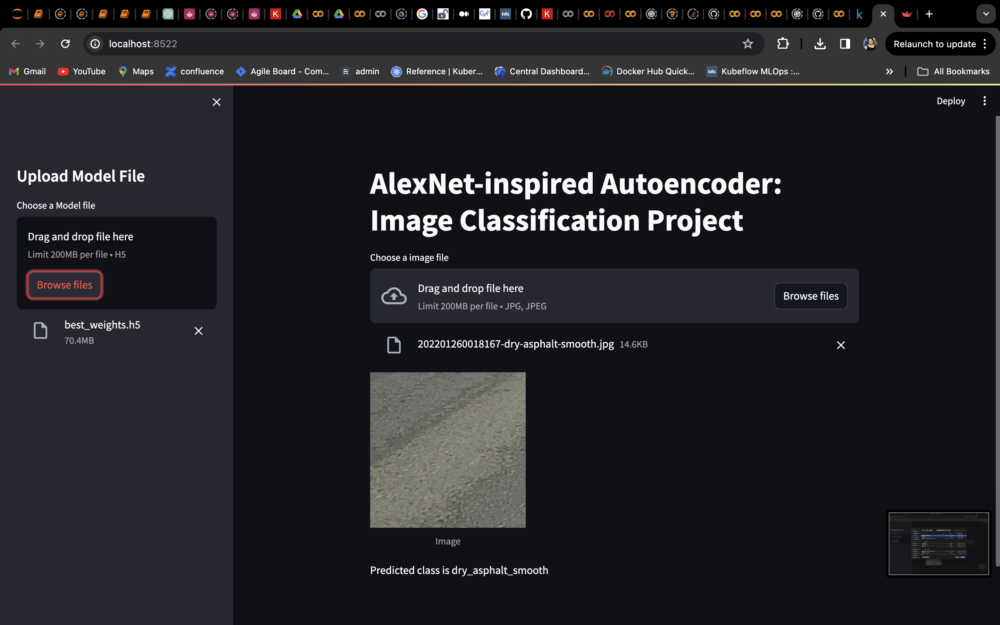